In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys
from collections import deque
import numpy as np
import pandas as pd
from subprocess import call
import matplotlib.pyplot as plt
from functools import partial
from dataclasses import dataclass
from pprint import pprint
from typing import List, Tuple, Union, Optional, Dict

import pybpr.count_model.dataset.movielens.data as movielens_data
from pybpr.count_model.evaluate.evaluate import *
from pybpr.count_model.evaluate.evaluation import Evaluation
from pybpr.count_model.evaluate.score_summary import ScoreSummary
from pybpr.count_model.assessor.avg_posterior import AvgPosterior
from pybpr.count_model.assessor.bayes_posterior import BayesPosterior
from pybpr.count_model.assessor.combined_posterior import CombinedPosterior
from pybpr.count_model.assessor.max_posterior import MaxPosterior
from pybpr.count_model.assessor.naive_bayes import NaiveBayes


from pybpr.count_model.feature_counter import FeatureCounter
from pybpr.count_model.porter_stem_counter import PorterStemCounter
from pybpr.count_model.interaction import Interaction
from pybpr.count_model.event_counter import EventCounter

import pybpr.count_model.dataset.movielens.nb as movielens_nb
from pybpr.count_model.assessor.nb_element import NBElement

from pybpr.count_model.dataset.zazzle.zazzle_nb import *


np.set_printoptions(threshold=sys.maxsize)
pd.set_option("display.max_colwidth", None)
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

pl.Config.set_tbl_rows(-1)
pl.Config.set_tbl_cols(-1)
pl.Config.set_tbl_width_chars(1024 * 16)
pl.Config.set_fmt_str_lengths(256)
pl.Config.set_fmt_table_cell_list_len(512)

data_path = os.path.join(
    os.path.curdir, "..", "..", "data", "NREL_User_Product_Interactions_2GB"
)

In [26]:
tables = await load_source_data(
    data_path,
    regenerate=True,
)

tm = {table.name: table for table in tables}

products: pl.LazyFrame = tm["products"].df
queries: pl.LazyFrame = tm["queries"].df
interactions: pl.LazyFrame = tm["interactions"].df
token_map: pl.LazyFrame = tm["token_map"].df
feature_map: pl.LazyFrame = tm["feature_map"].df
orderitems: pl.LazyFrame = tm["orderitems"].df
users: pl.LazyFrame = tm["users"].df

/home/ctripp/zazzle/pybpr/pybpr/count_model/dataset/zazzle/zazzle_nb.py:158: UserWarning: Cannot combine 'streaming' with 'comm_subplan_elim'. CSE will be turned off.
  print(queries.explain(streaming=True))
/home/ctripp/zazzle/pybpr/pybpr/count_model/dataset/zazzle/zazzle_nb.py:725: UserWarning: Cannot combine 'streaming' with 'comm_subplan_elim'. CSE will be turned off.
  print(df.explain(streaming=streaming))


 WITH_COLUMNS:
 [col("query_num").set_sorted()]
  WITH ROW INDEX
    --- STREAMING
 WITH_COLUMNS:
 [col("__POLARS_CSER_12484344134774016198").struct.field_by_name(3)().strict_cast(Categorical(None, Physical)).alias("category"), col("__POLARS_CSER_12484344134774016198").struct.field_by_name(4)().str.replace([String(\+), String( )]).alias("query"), col("cleaned_url").str.extract_groups().alias("__POLARS_CSER_12484344134774016198")]
  SORT BY [col("cleaned_url")]
    AGGREGATE
    	[len().alias("query_count")] BY [col("cleaned_url")] FROM
       SELECT [col("cleaned_url")] FROM

          Parquet SCAN 80 files: first file: ../../data/NREL_User_Product_Interactions_2GB/Clicks_0000_part_00.parquet
          PROJECT 1/5 COLUMNS  --- END STREAMING

      DF []; PROJECT */0 COLUMNS; SELECTION: "None"
save_tables ./../../data/NREL_User_Product_Interactions_2GB/output/queries_0.parquet...
 WITH_COLUMNS:
 [col("query_num").set_sorted()]
  WITH ROW INDEX
    --- STREAMING
 WITH_COLUMNS:
 [col("__P

/home/ctripp/zazzle/pybpr/pybpr/count_model/dataset/zazzle/zazzle_nb.py:207: UserWarning: Cannot combine 'streaming' with 'comm_subplan_elim'. CSE will be turned off.
  print(token_map.explain(streaming=True))


done.
Begin token_map, feature_map collection...
save_tables ./../../data/NREL_User_Product_Interactions_2GB/output/feature_map_0.parquet...
DF ["feature_num", "stem", "title_count", "long_description_count"]; PROJECT */5 COLUMNS; SELECTION: "None"
done.
Begin query stem mapping...
save_tables ./../../data/NREL_User_Product_Interactions_2GB/output/queries_0.parquet...
RENAME
   SELECT [col("query_num"), col("cleaned_url"), col("query_count"), col("category"), col("query_right")] FROM
     SELECT [col("query_num"), col("cleaned_url"), col("query_count"), col("category"), col("query").alias("query_right")] FROM
      INNER JOIN:
      LEFT PLAN ON: [col("query_num")]
        SORT BY [col("query_num")]

            Parquet SCAN ./../../data/NREL_User_Product_Interactions_2GB/output/queries_0.parquet
            PROJECT 4/5 COLUMNS
      RIGHT PLAN ON: [col("query_num")]
        AGGREGATE
        	[col("query")] BY [col("query_num")] FROM
          --- STREAMING
 WITH_COLUMNS:
 [col("query

/home/ctripp/zazzle/pybpr/pybpr/count_model/dataset/zazzle/zazzle_nb.py:725: UserWarning: Cannot combine 'streaming' with 'comm_subplan_elim'. CSE will be turned off.
  print(df.explain(streaming=streaming))


done.
Begin product stem mapping...
save_tables ./../../data/NREL_User_Product_Interactions_2GB/output/products_0.parquet...
 WITH_COLUMNS:
 [col("product_num").set_sorted()]
  WITH ROW INDEX
    SORT BY [col("product_id")]
       SELECT [col("product_id"), col("title"), col("final_department_id"), col("price_us_usd"), col("date_created"), col("date_modified"), col("is_customizable"), col("seller_id"), col("store_id"), col("group_id"), col("product_url_en_us"), col("product_type"), col("vision_style_id_1"), col("vision_style_score_1"), col("vision_embedding2"), col("title_stems"), col("long_description_stems")] FROM
        INNER JOIN:
        LEFT PLAN ON: [col("product_id")]
           SELECT [col("product_id"), col("title"), col("final_department_id"), col("price_us_usd"), col("date_created"), col("date_modified"), col("is_customizable"), col("seller_id"), col("store_id"), col("group_id"), col("product_url_en_us"), col("product_type"), col("vision_style_id_1"), col("vision_style_sco

In [17]:
interactions_c = interactions.collect()
interactions = interactions_c.lazy()
num_interactions = len(interactions_c)
test_size = 1000
test_interactions = interactions_c.sample(int(num_interactions * 0.1))
test_interactions.sample(3)

interaction_num,user_num,query_num,date_created,pass_nums,click_nums
u32,u32,u32,i32,list[u32],list[u32]
958938,37940,8082,1668875518,"[912950, 933894, 933954, 940574, 995908, 1016874, 1021678, 1028521, 1054150, 1097194, 1146535, 1161719, 1195513, 1196681, 1239497, 1245413, 1252428, 1260060, 1283316, 1318248, 1326743, 1356187, 1367710, 1394785, 1406544, 1410226, 1450710, 1453473, 1471482, 1476053, 1491004, 1522127, 1535264, 1547993, 1563198, 1570551, 1596588, 1597837, 1599424, 1605542, 1635629, 1674053, 1681643, 1702439, 1703734, 1731842, 1761367, 1798511, 1826621, 1842556, 1864216, 1865128, 1885958, 1945804, 1961780, 1964112]",[]
1302941,39556,549354,1675250585,"[368139, 502886, 519874, 530422, 538780, 544530, 1965432, 555194, 1141777, 1331691, 1367300, 1572131, 1573982, 1864802]",[553532]
1603187,24490,838324,1682663670,"[4392, 31801, 256252, 260522, 265716, 470645, 732527, 831812, 1046330, 1329369, 1345180, 1439198, 1503660, 1564600, 1566712, 1818476, 1873556, 1898287]",[]


In [19]:
queries.collect().sample(10)

query_num,cleaned_url,query_count,category,query
u32,str,u32,cat,list[u32]
447204,"""https://www.zazzle.com/s/grandson+high+school+graduation+cards""",54,"""s""","[346, 403, 210, 65, 0]"
496773,"""https://www.zazzle.com/s/iced+coffee+magnets""",2,"""s""","[667, 171, 60]"
413375,"""https://www.zazzle.com/s/funny+mens+tshirts+joke+hilarious""",102,"""s""","[18, 48, 38, 1063, 1387]"
810240,"""https://www.zazzle.com/s/son%20birthday%20-%20kayaking""",2,"""s""","[233, 26, 25, 28, 7, 26, 25, 28, 140, 26, 25, 28, 2448]"
370201,"""https://www.zazzle.com/s/fabrics+mid+century+modern+cats""",19,"""s""","[785, 542, 538, 49, 61]"
458898,"""https://www.zazzle.com/s/guest+book+memorial""",12,"""s""","[125, 81, 127]"
116753,"""https://www.zazzle.com/s/baby+bodysuits+add+photi""",15,"""s""","[11, 1005, 1087, 9919]"
161895,"""https://www.zazzle.com/s/birthday+greeting+card+dad+humor""",34,"""s""","[7, 75, 0, 313, 180]"
882890,"""https://www.zazzle.com/s/trinity+bible+college""",14,"""s""","[5126, 647, 480]"


In [25]:
"""
final_department_id (related to product_type but not completely hierarchically)
    + (department + product type is finer grained)
store_id
seller_id (parent of store_id)
price - quantized to $0.10 intervals ($1 = 100)
is_customizable
product_type - group of related sku's launched together
vision_style_id_1 - categorical
literal tokens/words (not stems)
+ attributes / product options could be really helpful: color, cardstock, etc.
+ product type readable names would be helpful
"""

products.collect().sample(1)

product_num,product_id,title,final_department_id,price_us_usd,date_created,date_modified,is_customizable,seller_id,store_id,group_id,product_url_en_us,product_design_image_url_en_us,product_image_url_en_us,product_type,vision_style_id_1,vision_style_score_1,vision_embedding2,subject,subject_score,title_stems,long_description_stems
u32,i64,str,i64,i32,i32,i32,bool,i64,i64,i64,str,str,str,cat,i64,f32,list[f32],str,f32,list[u32],list[u32]
1133146,256209246655902220,"""Watercolor Poinsettias Christmas Frame Wedding""",252829954291063384,377,1540551393,1671444053,true,238050465743967284,250005346743781162,105643637480455553,"""watercolor_poinsettias_christmas_frame_wedding_holiday_card-256209246655902220""","""watercolor_poinsettias_christmas_frame_wedding_holiday_card-r56bb8c1de372489c9e8a8adc11c47ce9_udffh_1337.webp?rvtype=pre""","""watercolor_poinsettias_christmas_frame_wedding_holiday_card-r56bb8c1de372489c9e8a8adc11c47ce9_udffh_1337.jpg""","""zazzle_foldedholidaycard""",251896901038877534,0.21,"[0.050073, 0.068503, 0.097979, -0.030922, -0.310813, -0.240313, 0.207055, -0.145654, -0.034724, 0.160539, -0.116647, 0.040643, -0.040806, -0.002743, 0.094959, 0.144521, -0.016325, -0.041229, -0.050585, 0.095611, 0.048538, -0.037864, 0.086118, -0.069946, 0.114673, -0.153199, 0.079897, -0.078751, 0.01049, -0.347569, 0.151764, 0.059757, 0.057249, 0.108616, -0.027436, -0.011292, 0.023156, 0.052672, -0.060365, -0.039671, 0.09084, 0.014273, -0.048866, -0.062552, 0.007878, -0.118499, 0.068545, -0.028473, -0.265365, -0.061455, 0.006392, 0.345114, 0.148586, -0.178896, 0.262688, 0.130037, -0.195742, -0.002414, 0.059307, 0.003694, -0.047245, -0.041429, -0.103784, 0.121411]","""chinoiserie%1:06:00::""",0.521166,"[1593, 174137, 3130, 85485, 193, 7764, 2090, 18117, 1593, 3176]","[1593, 174137, 3130, 85485, 193, 7764, 2090, 18117, 1593, 3176, 2474, 174521, 3130, 32040, 193, 3363, 47221, 93, 1832, 131, 1225, 131, 165, 95, 0, 895, 136, 666, 273, 62, 815, 95, 22, 0, 208, 384, 148, 3542, 89, 576, 39, 1690, 1886, 3511, 1695, 1886, 3569, 1886, 1074, 29, 1079, 208, 148, 1156, 1048, 703, 11651, 922, 1886, 1599, 20, 3167, 75, 208]"


In [4]:
ic = interactions_c.with_columns(
    (pl.col("date_created") * 1e6).cast(pl.Datetime).alias("dt_created")
)

print(ic["dt_created"].min(), ic["dt_created"].max())

2021-08-03 05:26:31 2023-08-09 23:51:18


In [5]:
# product_feature_map_c = (
#     products.select("product_num", pl.col("title_stems").alias("feature_num"))
#     .explode("feature_num")
#     .sort("product_num", "feature_num")
#     .collect()
# )
# product_feature_map = product_feature_map_c.lazy()
# print(product_feature_map_c.estimated_size() / 1024**2)

# del product_feature_map
# del product_feature_map_c

In [6]:
global_interval = 86400  # one day

mm = interactions.select(
    pl.col("date_created").min().alias("min"), pl.col("date_created").max().alias("max")
).collect()


def get_global_interval(timestamp):
    return timestamp // global_interval


min_interval = get_global_interval(mm[0, 0])
max_interval = get_global_interval(mm[0, 1])

global_intervals = pl.DataFrame(
    {"global_interval": np.arange(min_interval, max_interval + 1, 1, dtype=np.uint32)}
).set_sorted("global_interval")

In [16]:
interactions_source = interactions.select(
    get_global_interval(pl.col("date_created")).alias("global_interval"),
    pl.col("pass_nums"),
    pl.col("click_nums"),
)


def get_global_product_interactions(target_column, count_column):
    index_column = "global_interval"
    target_alias = "product_num"
    return (
        interactions_source.select(
            index_column, pl.col(target_column).alias(target_alias)
        )
        .explode(target_alias)
        .group_by(
            index_column,
            target_alias,
            # maintain_order=True,
        )
        .len(count_column)
        .sort("global_interval")
    )


global_product_counts = (
    get_global_product_interactions(
        "pass_nums",
        "pass_count",
    )
    .with_columns(pl.lit(0).alias("click_count"))
    .merge_sorted(
        get_global_product_interactions(
            "click_nums",
            "click_count",
        ).with_columns(pl.lit(0).alias("pass_count")),
        "global_interval",
    )
    # .with_columns(
    #     pl.col("pass_count").fill_null(0),
    #     pl.col("click_count").fill_null(0),
    # )
    .group_by("product_num", "global_interval")
    .agg(
        pl.col("pass_count").sum(),
        pl.col("click_count").sum(),
    )
    .sort("product_num", "global_interval")
    # .sort("global_interval", "product_num")
    .with_columns(
        pl.col("pass_count")
        .cum_sum()
        .over("product_num")
        .alias("pass_cumulative_count"),
        pl.col("click_count")
        .cum_sum()
        .over("product_num")
        .alias("click_cumulative_count"),
    )
)

# time + feature_num -> pass count, click count
# time + feature_num + user -> pass count, click count
streaming = True
print(global_product_counts.explain(streaming=streaming))
global_product_counts_c = global_product_counts.collect(streaming=streaming)
global_product_counts = global_product_counts_c.lazy()
print(global_product_counts_c.estimated_size() / 1024**2)
global_product_counts_c.sample(10)

/tmp/ipykernel_200646/1250898613.py:65: UserWarning: Cannot combine 'streaming' with 'comm_subplan_elim'. CSE will be turned off.
  print(global_product_counts.explain(streaming=streaming))


 WITH_COLUMNS:
 [col("pass_count").cum_sum().over([col("product_num")]).alias("pass_cumulative_count"), col("click_count").cum_sum().over([col("product_num")]).alias("click_cumulative_count")]
  SORT BY [col("product_num"), col("global_interval")]
    AGGREGATE
    	[col("pass_count").sum(), col("click_count").sum()] BY [col("product_num"), col("global_interval")] FROM
       SELECT [col("pass_count"), col("click_count"), col("product_num"), col("global_interval")] FROM
        MERGE SORTED
          --- STREAMING
UNION
  PLAN 0:
    RECHUNK
       WITH_COLUMNS:
       [0.alias("click_count")]
        SORT BY [col("global_interval")]
          AGGREGATE
          	[len().alias("pass_count")] BY [col("global_interval"), col("product_num")] FROM
            EXPLODE
               SELECT [col("global_interval"), col("pass_nums").alias("product_num")] FROM
                 SELECT [[(col("date_created")) floor_div (86400)].alias("global_interval"), col("pass_nums")] FROM
                  D

product_num,global_interval,pass_count,click_count,pass_cumulative_count,click_cumulative_count
u32,i32,u32,i32,u32,i32
1504367,18925,1,0,1,0
285846,19357,1,0,24,0
1492119,19299,1,0,19,0
1391477,19038,1,0,33,0
773187,19159,1,0,17,0
1926681,19366,1,0,471,0
1854868,19194,1,0,10,0
1399660,19471,2,0,22,0
1754221,19466,1,0,41,0


In [12]:
# dept, product type, price, markup, sharon's diamond score (quantized), store, seller, product option

global_feature_counts = (
    global_product_counts.join(
        products.select(
            pl.col("product_num"), pl.col("title_stems").alias("feature_num")
        ),
        "product_num",
    )
    .drop("product_num")
    .explode("feature_num")
    .group_by(
        "global_interval",
        "feature_num",
    )
    .agg(
        pl.col("pass_count").sum(),
        pl.col("click_count").sum(),
    )
    .sort("feature_num", "global_interval")
    .with_columns(
        pl.col("pass_count")
        .cum_sum()
        .over("feature_num")
        .alias("pass_cumulative_count"),
        pl.col("click_count")
        .cum_sum()
        .over("feature_num")
        .alias("click_cumulative_count"),
    )
)


# time + feature_num -> pass count, click count
# time + feature_num + user -> pass count, click count
streaming = True
print(global_feature_counts.explain(streaming=streaming))
global_feature_counts_c = global_feature_counts.collect(streaming=streaming)
print(global_feature_counts_c.estimated_size() / 1024**2)
global_feature_counts_c.tail(50)

/tmp/ipykernel_200646/3538409349.py:35: UserWarning: Cannot combine 'streaming' with 'comm_subplan_elim'. CSE will be turned off.
  print(global_feature_counts.explain(streaming=streaming))


 WITH_COLUMNS:
 [col("pass_count").cum_sum().over([col("feature_num")]).alias("pass_cumulative_count"), col("click_count").cum_sum().over([col("feature_num")]).alias("click_cumulative_count")]
  --- STREAMING
SORT BY [col("feature_num"), col("global_interval")]
  AGGREGATE
  	[col("pass_count").sum(), col("click_count").sum()] BY [col("global_interval"), col("feature_num")] FROM
    EXPLODE
       SELECT [col("global_interval"), col("pass_count"), col("click_count"), col("feature_num")] FROM
        INNER JOIN:
        LEFT PLAN ON: [col("product_num")]
          DF ["global_interval", "product_num", "pass_count", "click_count"]; PROJECT 4/6 COLUMNS; SELECTION: "None"
        RIGHT PLAN ON: [col("product_num")]
           SELECT [col("product_num"), col("title_stems").alias("feature_num")] FROM
            SORT BY [col("product_num")]

                Parquet SCAN ./../../data/NREL_User_Product_Interactions_2GB/output/products_0.parquet
                PROJECT 2/22 COLUMNS
        END 

global_interval,feature_num,pass_count,click_count,pass_cumulative_count,click_cumulative_count
i32,u32,u32,u32,u32,u32
19527,193946,3,0,2682,81
19528,193946,2,0,2684,81
19529,193946,4,0,2688,81
19530,193946,3,0,2691,81
19531,193946,4,0,2695,81
19532,193946,3,0,2698,81
19533,193946,2,0,2700,81
19534,193946,5,0,2705,81
19535,193946,4,0,2709,81


In [36]:
interaction_sample = interactions_c.sample(int(num_interactions * 0.01))
# user feature counts?

print(interaction_sample.select(pl.col("user_num")).n_unique())
print(len(interaction_sample))

# user, interaction -> user, product, time -> user, features, time -> feature counts
interaction_sample.lazy().join()

14961
19040


In [6]:
print(interaction_feature_map_c.estimated_size() / 1024**2)

4581.665470123291


In [17]:
# interactions_subset = interactions.lazy()
interactions_subset = interactions_c.head(int(num_interactions * 0.6)).lazy()


cumulative_feature_counts = (
    interactions_subset.select(
        "interaction_num", pl.col("pass_nums").alias("product_num")
    )
    .explode("product_num")
    # .drop_nulls("product_num")
    .join(
        products.select(
            "product_num", pl.col("title_stems").alias("feature_num")
        ).explode("feature_num"),
        "product_num",
    )
    # .explode("feature_num")
    # .drop("product_num")
    # .sort("interaction_num", "feature_num")
    .group_by("interaction_num", "feature_num")
    .len("feature_count")
    # .agg(
    #     pl.len()
    #     .cast(pl.UInt16, strict=False)
    #     .fill_null(int(2**16 - 1))
    #     .alias("feature_count")
    # )
    .with_columns(pl.col("feature_count").cum_sum().over("feature_num"))
)
#     # .sort("feature_num", 'interaction_num')
#     # .with_columns(
#     #     pl.cum_count().over('feature_num').alias('feature_count')
#     # )
#     .group_by("interaction_num", "feature_num")
#     .agg(
#         pl.len().alias("feature_count"),
#     )
#     .with_columns(
#         pl.cum_sum("feature_count").over("feature_num"),
#     )
# )
print(cumulative_feature_counts.explain(streaming=True))

cumulative_feature_counts_c = cumulative_feature_counts.collect(streaming=True)
print((2**32 - 1) / cumulative_feature_counts_c["feature_count"].max())
cumulative_feature_counts_c.tail(10000)

# .join(
#     feature_map.select("feature_num")
# )

/tmp/ipykernel_83633/1526569934.py:43: UserWarning: Cannot combine 'streaming' with 'comm_subplan_elim'. CSE will be turned off.
  print(cumulative_feature_counts.explain(streaming=True))


 WITH_COLUMNS:
 [col("feature_count").cum_sum().over([col("feature_num")])]
  --- STREAMING
AGGREGATE
	[len().alias("feature_count")] BY [col("interaction_num"), col("feature_num")] FROM
   SELECT [col("product_num"), col("interaction_num"), col("feature_num")] FROM
    INNER JOIN:
    LEFT PLAN ON: [col("product_num")]
      EXPLODE
         SELECT [col("interaction_num"), col("pass_nums").alias("product_num")] FROM
          DF ["interaction_num", "user_num", "query_num", "date_created"]; PROJECT 2/6 COLUMNS; SELECTION: "None"
    RIGHT PLAN ON: [col("product_num")]
      DF ["product_num", "feature_num"]; PROJECT 2/2 COLUMNS; SELECTION: "None"
    END INNER JOIN  --- END STREAMING

    DF []; PROJECT */0 COLUMNS; SELECTION: "None"
94.49457634403663


interaction_num,feature_num,feature_count
u32,u32,u32
1136227,476,1174418
931425,8348,48237
614482,185682,86971
20577,8395,1687034
481359,131631,840
213683,8816,438817
651875,390,29269
640,13,268592
474874,5434,371744


In [9]:
20080813 / 2**32

0.004675428615882993

In [5]:
for table in tables:
    print(f"{table.name}:\t{(table.df.estimated_size() / (1024**2)):10.1f} MB")

products:	    1724.9 MB
queries:	      84.0 MB
interactions:	     630.3 MB
token_map:	       5.7 MB
feature_map:	       4.4 MB
orderitems:	      10.8 MB
users:	       3.1 MB


In [ ]:
# for table in tables:
#     # print(type(table.df))
#     print(table.name)
#     table.df = table.df.collect()

products
queries
interactions
token_map
feature_map
orderitems
users


In [7]:
queries.sample(10)

query_num,cleaned_url,query_count,category,query
u32,str,u32,cat,list[u32]
798082,"""https://www.zazzle.com/s/simple+elegance+table+seating""",20,"""s""","[105, 34, 42, 68]"
558330,"""https://www.zazzle.com/s/make+a+tile""",3,"""s""","[673, 136, 120]"
425810,"""https://www.zazzle.com/s/gifts+for+expectant+mother""",151,"""s""","[10, 20, 1625, 94]"
662516,"""https://www.zazzle.com/s/personalized+blush+pink+thank+you""",9,"""s""","[41, 168, 88, 21, 19]"
753332,"""https://www.zazzle.com/s/return+and+recipient+address+envelopes""",31,"""s""","[36, 29, 1766, 23, 50]"
453666,"""https://www.zazzle.com/s/greeting+cards+for+boys""",172,"""s""","[75, 0, 20, 79]"
160689,"""https://www.zazzle.com/s/birthday+cards+with+labradore""",417,"""s""","[7, 0, 62, 1264]"
604585,"""https://www.zazzle.com/s/mt.+vernon+postcards""",9,"""s""","[2573, 208, 6124, 2]"
366847,"""https://www.zazzle.com/s/eucalyptus+greenery+thank+you+stickers""",4,"""s""","[126, 141, 21, 19, 8]"


In [8]:
interactions.sample(20).join(queries, "query_num")

shape: (20, 9)
┌──────────┬───────────┬──────────────┬───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┬───────────────────────────────────────────────────────┬──────────────────────────────────────────────────────────────────┬─────────────┬──────────┬──────────────────────────────────────────────────────────────────────┐
│ user_num ┆ query_num ┆ date_created ┆ pass_nums                                                                                                                                                                                                                                                         ┆ click_nums                                            ┆ cleaned_url                                                      ┆ query_count ┆ category ┆ query                                                                │
│ ---      ┆ ---       ┆ ---          ┆ ---                                                                                                                                                                                                                                                               ┆ ---                                                   ┆ ---                                                              ┆ ---         ┆ ---      ┆ ---                                                                  │
│ u32      ┆ u32       ┆ i32          ┆ list[u32]                                                                                                                                                                                                                                                         ┆ list[u32]                                             ┆ str                                                              ┆ u32         ┆ cat      ┆ list[u32]                                                            │
╞══════════╪═══════════╪══════════════╪═══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════╪═══════════════════════════════════════════════════════╪══════════════════════════════════════════════════════════════════╪═════════════╪══════════╪══════════════════════════════════════════════════════════════════════╡
│ 902      ┆ 3782      ┆ 1661943293   ┆ [907117, 907117, 914212, 916992, 916992, 924581, 924581, 1006011, 1013495, 1039937, 1080579, 1080579, 1098768, 1136794, 1147418, 1161396, 1169874, 1174370, 1184397, 1207882, 1213102, 1217765, 1259451, 1319442, 1333469, 1380572, 1384477, 1388867, 1406684, 1… ┆ []                                                    ┆ https://www.zazzle.com/back+to+school+pens                       ┆ 1094        ┆ null     ┆ [431, 92, 210, 429]                                                  │
│ 28819    ┆ 8220      ┆ 1647408816   ┆ [1344571, 1344571, 1344571, 1606086, 1606086, 1606086, 1980779, 1980779, 1980779]                                                                                                                                                                                 ┆ [1606086, 1606086, 1606086]                           ┆ https://www.zazzle.com/c/clocks                                  ┆ 38426       ┆ c        ┆ [415]                                                                │
│ 78126    ┆ 8866      ┆ 1648660951   ┆ [675909, 875192, 888552, 915895, 942396, 945563, 949514, 964153, 972664, 973350, 978947, 984085, 987331, 995951, 1006387, 1006463, 1025036, 1031358, 1067571, 1070266, 1075267, 1080391, 1098773, 1135408, 1148900, 1153200, 1167217, 1176027, 1181314, 1194089,… ┆ []                                                  

In [9]:
queries.sample(20)

query_num,cleaned_url,query_count,category,query
u32,str,u32,cat,list[u32]
236014,"""https://www.zazzle.com/s/cat+are+like+potato+chips""",17,"""s""","[61, 703, 470, 3517, 1794]"
325194,"""https://www.zazzle.com/s/deutschland+envelope+stickers""",8,"""s""","[11626, 50, 8]"
192150,"""https://www.zazzle.com/s/boy+personalized+dinosaur+baby+pillow""",15,"""s""","[79, 41, 457, 11, 133]"
192750,"""https://www.zazzle.com/s/boys+6th+birthday+cards""",10,"""s""","[79, 115, 44, 7, 0]"
461182,"""https://www.zazzle.com/s/hair+by+business+cards""",116,"""s""","[443, 418, 27, 0]"
776150,"""https://www.zazzle.com/s/sandstone+squirrel+coaster""",1,"""s""","[3534, 847, 332]"
262306,"""https://www.zazzle.com/s/christmas+plaid+mug+modern""",26,"""s""","[5, 606, 54, 49]"
252346,"""https://www.zazzle.com/s/christian+business+card+prayer""",36,"""s""","[309, 27, 0, 598]"
213423,"""https://www.zazzle.com/s/burgundy+silver+gray+wedding+suite""",1,"""s""","[221, 387, 909, 1, 1100]"


In [10]:
feature_map.head(20)

feature_num,stem,title_count,long_description_count,query_count
u32,str,u32,u32,u32
0,"""card""",19920,398120,24196515
1,"""wed""",15883,409219,16535504
2,"""postcard""",5934,69081,13684089
3,"""paper""",3469,103948,12240979
4,"""invit""",6432,234938,12031295
5,"""christma""",2403,23177,8947031
6,"""shower""",11054,166012,8081850
7,"""birthday""",14292,180825,7367138
8,"""sticker""",3545,72432,6771290


In [13]:
orderitems.sample(20)

date_created,user_num,product_num
i64,u32,u32
1681288624,15875,665338
1652431220,7000,174921
1661099660,17970,1901991
1691167070,47618,1761138
1647180287,26073,1659673
1647021101,82251,95511
1665899442,40430,76909
1658478224,48236,1689285
1669897977,65457,982325


In [14]:
users.sample(20)

user_num,user_id
u32,str
53147,"""a53a4315-bfcb-4cd7-9a53-6829ccec2d5e"""
48352,"""96497877-bc3a-44c9-a509-ef9694f40899"""
9265,"""1cac3008-28f8-493d-a2d0-9d9073e9de28"""
31811,"""6346ff7d-6ac3-4b37-8c96-9b9526930549"""
583,"""01d779ac-52bc-470f-94b6-a530401671ba"""
70441,"""da50bdc3-3336-45c4-9d91-e33f4c8b313e"""
69355,"""d6f61589-b637-45a2-b079-b7910c0fcdb9"""
45461,"""8d41b557-7b19-4846-a92c-2db18fa0b9e0"""
68135,"""d3506055-bdce-4edb-91c7-5e0fe6209f94"""


In [15]:
products.sample(3)

product_num,product_id,title,final_department_id,price_us_usd,date_created,date_modified,is_customizable,seller_id,store_id,group_id,product_url_en_us,product_design_image_url_en_us,product_image_url_en_us,product_type,vision_style_id_1,vision_style_score_1,vision_embedding2,subject,subject_score,title_stems,long_description_stems
u32,i64,str,i64,i32,i32,i32,bool,i64,i64,i64,str,str,str,cat,i64,f32,list[f32],str,f32,list[u32],list[u32]
486881,227357107772561277,"""Vincent Van Gogh - Wheat Field with Cypresses""",252433211471182884,1575,1614811027,1681361840,true,238706419518580930,250618248643602560,105280274704296809,"""vincent_van_gogh_wheat_field_with_cypresses_ceramic_tile-227357107772561277""","""vincent_van_gogh_wheat_field_with_cypresses_ceramic_tile-r28590aee1d5140a1bc2e0f423bd51725_agtk1_8byvr_1337.webp?rvtype=pre""","""vincent_van_gogh_wheat_field_with_cypresses_ceramic_tile-r28590aee1d5140a1bc2e0f423bd51725_agtk1_8byvr_1337.jpg""","""zazzle_tile""",251241081129437051,0.28,"[0.097126, 0.096424, -0.081407, -0.224739, 0.039357, 0.155313, 0.059417, -0.137346, 0.052673, -0.01379, 0.105535, 0.078017, -0.011333, -0.034207, 0.195373, -0.015722, -0.01212, -0.019982, -0.017989, 0.122641, -0.069758, 0.037477, 0.075671, -0.177039, -0.037756, 0.048728, 0.066836, 0.022937, -0.022319, -0.110758, -0.074535, -0.073775, -0.122039, 0.153318, 0.075481, -0.10943, 0.031844, -0.257988, 0.015764, -0.257529, -0.037545, -0.196098, 0.007741, -0.123779, 0.034901, 0.213122, 0.052029, 0.09935, -0.021788, -0.029967, 0.06274, 0.269214, 0.000607, -0.026982, -0.404271, -0.033667, 0.205114, 0.008572, -0.099117, 0.092638, -0.002658, 0.277797, -0.137557, 0.141236]","""landscape%2:36:01::""",0.617315,"[2016, 34047, 2016, 1748, 2595, 164075, 140, 1593, 4881, 2090, 190672, 62, 193, 163104]","[1593, 4881, 2090, 190672, 62, 193, 163104, 15703, 193, 18881, 759, 6723, 161109, 72752, 140, 2016, 34047, 2016, 1748, 2595, 164075, 1886, 3371, 17481, 67, 101, 101, 87]"
937280,256029103023703258,"""Little Prince Birthday Invitation in Blue & Gold""",252554306911291288,285,1471589761,1676726003,true,238885648237986014,250529968339980517,105202045936312951,"""little_prince_birthday_invitation_in_blue_gold-256029103023703258""","""little_prince_birthday_invitation_in_blue_gold-r94df970e2a1e4e348858c13ac35292e4_tcvqa_1337.webp?rvtype=pre""","""little_prince_birthday_invitation_in_blue_gold-r94df970e2a1e4e348858c13ac35292e4_tcvqa_1337.jpg""","""zazzle_invitation3""",0,0.07,[],"""happy birthday""",0.527315,"[2142, 6769, 3130, 179917, 1021, 7703, 384, 4440, 66, 1021, 20910, 132781, 2595, 230]","[384, 6241, 23246, 92, 131, 280, 166039, 7, 35, 62, 815, 554, 280, 1611, 158, 4, 2486, 148, 45253, 396, 11668, 2155, 2695, 20566, 24, 982, 3130, 147617, 194, 24, 1327, 2637, 208, 148, 1156, 431, 451, 708, 1886, 92616, 1593, 193413, 3119, 280, 79, 5025, 24, 228, 39, 136, 1611, 208, 92616, 148, 1156, 308, 29, 201, 703, 48734, 919, 29, 24, 270, 437, 144, 359, 29, 2145, 24, 1829, 39, 693, 308, 568, 201, 208]"
789604,239619830144971178,"""Festive Red Fawn Green Snowflake Postcard Christm""",252531976106294454,145,1322264839,1622529299,true,238051724026078721,250709131932610217,105246126057654899,"""festive_red_fawn_green_snowflake_postcard_christm-239619830144971178""","""festive_red_fawn_green_snowflake_postcard_christm-raa9770bafb9548df99ad90f51da33d5e_ucbjp_1337.webp?rvtype=pre""","""festive_red_fawn_green_snowflake_postcard_christm-raa9770bafb9548df99ad90f51da33d5e_ucbjp_1337.jpg""","""zazzle_postcard2""",251086224148679793,0.59,"[0.0554, 0.005451, 0.224881, 0.021974, 0.123283, 0.111672, -0.060584, -0.004575, 0.158272, -0.070413, 0.07273, -0.176276, 0.059373, 0.121707, 0.017845, 0.161083, 0.075649, -0.2416, 0.144468, 0.076795, -0.115579, 0.057588, -0.042817, -0.017554, 0.131746, -0.101591, -0.222681, -0.152016, 0.107442, 0.022212, -0.190133, 0.244742, -0.085948, 0.137009, 0.191742, 0.01621, -0.107853, 0.073406, -0.140964, 0.188215, 0.159363, 0.078747, -0.022005, -0.078334, -0.093997,

In [ ]:
"""
+ run NB over time
+ collect global counts periodically with a fixed rate
+ select a test subset of interactions (maybe individual clicks or passes?)
    + evaluate model on these
        + count of # user feature passes or # user feature clicks at given time
"""

In [13]:
x.filter(pl.col("user_num") == 25314).explode("click_nums")

user_num,query_num,date_created,pass_nums,click_nums
u32,u32,i32,list[u32],u32
25314,0,1627973041,"[82514, 110147, 166589, 167507, 797270]",null


In [ ]:
# test_times = test_interactions.select(pl.col("date_created"), pl.col("user_num"))
# test_times.sort('date_created').join_asof(test_interactions.join_asof(interactions.sort('date_created'), 'date_created', strategy='')

In [33]:
dataset_name = "ml-100k"
ratings = movielens_data.load_movielens_data(dataset_name)
ratings["positive"] = (ratings["rating"] >= 4).astype(np.bool_)
# print(ratings.head())
print(ratings.columns)

movies = movielens_data.load_movielens_items(dataset_name)
for genre in movielens_nb.category_columns:
    movies[genre] = movies[genre].astype(np.bool_)
# print(ratings.head())
print(movies.columns)

movielens_data.stem_movies(movies)
ratings = movielens_data.join_ratings_and_movies(ratings, movies)
print(ratings.head())
print(ratings.columns)

ratings_by_time = ratings.set_index(
    ["positive", "timestamp", "item_id", "user_id"], drop=False
)
ratings_by_time.sort_index(inplace=True)

ratings_by_user = ratings.set_index(["user_id", "timestamp", "item_id"], drop=False)
ratings_by_user.sort_index(inplace=True)

ratings_by_item = ratings.set_index(
    ["item_id", "positive", "timestamp", "user_id"], drop=False
)
ratings_by_item.sort_index(inplace=True)

# ratings_by_item_timestamp_user = ratings.set_index(
#     ["item_id", "user_id", "timestamp"], drop=False
# )[["user_id", "positive"]]
# ratings_by_item_timestamp_user.sort_index(inplace=True)

ratings_by_genre = {}
for genre in movielens_nb.category_columns:
    ratings_by_genre[genre] = ratings.set_index(
        [genre, "positive", "timestamp", "item_id", "user_id"], drop=False
    ).sort_index()


ratings_by_item_user = ratings.set_index(
    [
        "item_id",
        "positive",
        "user_id",
    ],
    drop=False,
)
ratings_by_item_user.sort_index(inplace=True)
# train_df, test_df = movielens.train_test_split(ratings)

print(ratings.dtypes)

test_df = ratings.sample(1000).copy().sort_values("timestamp")

Index(['user_id', 'item_id', 'rating', 'timestamp', 'positive'], dtype='object')
Index(['item_id', 'movie title', 'release date', 'video release date',
       'IMDb URL', 'Action', 'Adventure', 'Animation', 'Children's', 'Comedy',
       'Crime', 'Documentary', 'Drama', 'Fantasy', 'Film-Noir', 'Horror',
       'Musical', 'Mystery', 'Romance', 'Sci-Fi', 'Thriller', 'War', 'Western',
       'unknown'],
      dtype='object')
       user_id  item_id  rating  timestamp  positive  item_id_  \
214        259      255       4  874724710      True       255   
83965      259      286       4  874724727      True       286   
43027      259      298       4  874724754      True       298   
21396      259      185       4  874724781      True       185   
82655      259      173       4  874724843      True       173   

                           movie title release date  video release date  \
214    My Best Friend's Wedding (1997)  20-Jun-1997                 NaN   
83965      English Patient,

In [24]:
def make_cumulative_count(sorted_ratings, groupby):
    result = sorted_ratings.groupby(groupby)["present"].cumcount() + 1
    result.name = "count"
    result = result.reset_index()
    result.set_index(
        [*[c for c in groupby if c in result.columns], "timestamp"], inplace=True
    )
    result.drop([c for c in result.columns if c != "count"], axis=1, inplace=True)
    result.sort_index(inplace=True)
    return result


sorted_ratings = ratings.copy()  # .sort_values(["timestamp"])
sorted_ratings.set_index(["timestamp", "item_id", "user_id", "positive"], inplace=True)
sorted_ratings.sort_index(inplace=True)
sorted_ratings["present"] = 1
# print(sorted_ratings.head())

# cumulative per-item interaction counts
per_item_interaction_counts = make_cumulative_count(
    sorted_ratings, ["item_id", "positive"]
)
# per_item_interaction_counts.name = 'count'
# per_item_interaction_counts = per_item_interaction_counts.reset_index()
# per_item_interaction_counts.set_index(["item_id", "positive", "timestamp"], inplace=True)

# cumulative per-genre interaction counts
per_genre_interaction_counts = {}
for genre in movielens_nb.category_columns:
    df = make_cumulative_count(sorted_ratings, ["item_id", genre, "positive"])
    # df.set_index(["item_id", "positive"], inplace=True)
    per_genre_interaction_counts[genre] = df

# cumulative per-user interaction counts
per_user_interaction_counts = make_cumulative_count(
    sorted_ratings, ["user_id", "positive"]
)
# per_user_interaction_counts.set_index(["user_id", "positive"], inplace=True)

# cumulative per-user per-genre interaction counts
per_user_genre_interaction_counts = {}
for genre in movielens_nb.category_columns:
    df = make_cumulative_count(sorted_ratings, ["user_id", genre, "positive"])
    # df.set_index(["user_id", genre, "positive"], inplace=True)
    per_user_genre_interaction_counts[genre] = df


print(per_item_interaction_counts.sample(10))

                            count
item_id positive timestamp       
272     True     891296919    122
474     True     880139323     62
370     False    880333494     12
1479    False    891702457      7
185     True     879545603     58
50      True     884304328    312
906     False    883757468      2
2       True     880939035     20
68      False    882347577     28
89      True     882669740    112


In [7]:
# counter = movielens_data.count_events(ratings)

In [8]:
# from pybpr.count_model.link_counter import LinkCounter
# from pybpr.count_model.uniform_prior_model import UniformPriorModel
# from pybpr.count_model.window_counter import WindowCounter
# from pybpr.count_model.permutation_counter import PermutationCounter
# from pybpr.count_model.link_count_data import LinkCountData


# event_counter = LinkCounter()
# co_occurrence_counter = PermutationCounter(LinkCounter())

# action_to_feature_counter = LinkCounter()
# user_action_to_feature_counter = LinkCounter()

# # counter = WindowCounter(LinkCounter(), 10)

In [9]:
# user liking or disliking linked to feature
# P(previously clicked/didn't click product with feature F | click on A with feature F)
# "forward" way: P(click on product with F | clicked on a product with F)
# P(clicked on a product with F | click on product with F)
# source to dest / sum(all sources to dest)
# (click on F, click on F again) / sum(click on F, click or nonclick on F again) -> how much does a click on an item with F mean the user will click on another with F
# "what proportion of the time does the user click on products with F when shown them?"
# "If a user clicks on a product with feature F, how likely are they to click on another one with F?"
# (click on F, click on F again) / (click on F, nonclick on F)
# in aggregate: (interact with F >= 2 times)
# num clicks on F, num non-clicks on F
# simple model might have repeated probability ~= (num F clicks / total F interactions )
# (one previous click on F | click on F) vs (one previous click on F | nonclick on F) -> high
# one previous nonclick on F | click on F -> low
# many previous clicks on F | click on F -> very high

In [10]:
# print(len(test_df_sample))
# pos_df = test_df[test_df["positive"] == 1]
# neg_df = test_df[test_df["positive"] == 0]

+ Low vs High interaction items/actions
+ Sequence-Based Factors
    + Previous N actions -> Next action
    + A,B,C,D sequence counts up how many times [A,B,C] happened and then [D] happened
    + P(D | A, B, C happened most recently)
    + Ordered and unordered conditioning 
        + P(D | A then B then C happened)
            + flipped: P(A,B,C happened | D happened next)
                + ~= (# times A,B,C happened before D / # times D happened)
        + P(D | A, B, and C all recently happened)
            + flipped: P(A,B,C happened | D happened next)
                + ~= (# times A,B,C happened before D / # times D happened)
+ Destination-Based Factors
    + A,B,C,D sequence counts up how many times A preceeded D, B, preceeded, D, and C preceeded D in the previous N actions.
    + P(D | A happened within the previous N actions), P(D | B happened within the previous N actions), etc...
        + flipped version used in NB calculation: P(A happened in previous N actions | D happened)
            + ~= (# times D happened after A / # times D happened)
+ Heuristics to compensate for Conditional Independance Assumption
+ Feature-Based Factors
    + A has feature X, B has feature X:
        + P(click another product with feature X | clicked N products with feature X)
        + flipped: P(clicked N products with X | clicked another product with X)
            + ~= (# times clicked N+1 products with X) / (# times clicked N products with X)
            + maybe simplified into (# times clicked N+1 products with X with N+1 >= 2) / (# times clicked N products with X)
                + How often a clicker of a product with X clicks on another product with X
    + alternate framing / method:
        + use clicks to update probabilities that user likes or dislikes a feature
            + or 'affinity' for feature
        + then use the feature affinities to predict likelihood of action/click


In [11]:
from typing import Callable
from pybpr.count_model.assessor.naive_bayes import NaiveBayes
from pybpr.count_model.dataset.movielens import *
import pybpr.count_model.assessor.factored_naive_bayes as factored_naive_bayes


def make_uniform_assesment(p: float) -> Callable[[Interaction], float]:
    def assess(interaction: Interaction) -> float:
        if interaction.verb:
            return p
        return 1.0 - p

    return assess

In [12]:
bayes_rate = ratings["positive"].mean()
print(bayes_rate)

0.55375


In [13]:
bayes_rate_score = movielens_data.compute_scores(
    test_df,
    make_uniform_assesment(bayes_rate),
)

pprint(bayes_rate_score)

[('log', 1000), ('brier', 1000), ('prob', 1000), ('accuracy', 1000)]
1000 1000
           user_id      item_id       rating     timestamp     item_id_  \
count  1000.000000  1000.000000  1000.000000  1.000000e+03  1000.000000   
mean    453.490000   421.386000     3.524000  8.836018e+08   421.386000   
std     260.937038   336.631044     1.151847  5.393229e+06   336.631044   
min       1.000000     1.000000     1.000000  8.747299e+08     1.000000   
25%     256.000000   174.000000     3.000000  8.794629e+08   174.000000   
50%     441.500000   309.000000     4.000000  8.829388e+08   309.000000   
75%     653.000000   622.250000     4.000000  8.885191e+08   622.250000   
max     943.000000  1615.000000     5.000000  8.932836e+08  1615.000000   

       video release date          log        brier         prob     accuracy  
count                 0.0  1000.000000  1000.000000  1000.000000  1000.000000  
mean                  NaN    -0.687736     0.494598     0.505590     0.552000  
std  

In [22]:
per_movie_bayes_rate_score = movielens_data.compute_scores(
    test_df,
    movielens_nb.make_assess_nb(
        movielens_nb.make_nb_prior(ratings_by_item, NBElement(bayes_rate, 1.0) * 2),
        [],
    ),
)

pprint(per_movie_bayes_rate_score)

0 0
0 0
0 1
2 0
0 0
0 2
3 0
0 0
5 1
0 4
1 1
1 0
3 1
0 0
1 0
0 0
3 0
0 0
1 1
5 2
0 0
1 0
0 0
2 0
5 0
0 2
2 0
6 0
3 10
1 0
1 2
4 5
16 0
13 5
1 0
0 0
3 0
6 3
3 3
6 1
2 0
5 3
2 3
1 3
14 4
1 1
6 1
10 1
4 6
3 0
7 0
0 4
1 0
16 4
5 7
8 2
29 11
7 19
0 0
1 2
0 1
2 0
4 3
14 4
1 1
0 0
10 10
5 6
8 2
4 0
7 5
15 14
3 2
21 2
13 14
2 1
1 0
1 1
11 6
10 6
13 6
3 0
8 2
1 0
14 6
0 0
8 3
4 4
3 1
18 8
8 8
6 3
23 6
21 9
12 6
16 6
8 2
3 13
13 7
7 2
12 4
17 12
35 14
9 3
23 4
4 2
17 14
23 6
8 18
13 8
10 4
0 1
7 21
24 7
20 15
19 18
7 11
15 8
6 6
19 43
11 10
6 2
3 16
49 15
2 1
2 2
2 1
23 16
8 2
4 4
3 3
19 7
54 4
40 10
7 1
11 17
14 9
7 27
8 8
4 20
10 17
23 10
43 16
3 1
6 27
14 28
3 9
34 28
19 9
28 35
27 14
9 11
10 2
29 12
2 0
44 10
1 0
14 8
5 2
4 18
50 4
1 14
15 21
1 1
7 0
11 4
6 4
47 39
50 13
17 8
25 14
38 10
7 3
6 0
7 6
54 21
6 9
62 14
11 18
23 7
1 2
24 32
11 22
52 11
33 56
37 51
0 0
3 12
5 0
55 48
6 2
17 11
6 1
15 25
9 0
6 6
50 33
26 8
20 40
3 8
32 20
23 13
18 21
6 13
15 9
39 8
29 13
12 34
26 27
4 18
34 20
18 5


In [25]:
per_movie_bayes_rate_score = movielens_data.compute_scores(
    test_df,
    movielens_nb.make_assess_nb(
        movielens_nb.make_nb_prior_with_cumulative_sums(
            per_item_interaction_counts, NBElement(bayes_rate, 1.0) * 2
        ),
        [],
    ),
)

pprint(per_movie_bayes_rate_score)

0 0
0 0
0 1
2 0
0 0
0 2
3 0
0 0
5 1
0 4
1 1
1 0
3 1
0 0
1 0
0 0
3 0
0 0
1 1
5 2
0 0
1 0
0 0
2 0
5 0
0 2
2 0
6 0
3 10
1 0
1 2
4 5
16 0
13 5
1 0
0 0
3 0
6 3
3 3
6 1
2 0
5 3
2 3
1 3
14 4
1 1
6 1
10 1
4 6
3 0
7 0
0 4
1 0
16 4
5 7
8 2
29 11
7 19
0 0
1 2
0 1
2 0
4 3
14 4
1 1
0 0
10 10
5 6
8 2
4 0
7 5
15 14
3 2
21 2
13 14
2 1
1 0
1 1
11 6
10 6
13 6
3 0
8 2
1 0
14 6
0 0
8 3
4 4
3 1
18 8
8 8
6 3
23 6
21 9
12 6
16 6
8 2
3 13
13 7
7 2
12 4
17 12
35 14
9 3
23 4
4 2
17 14
23 6
8 18
13 8
10 4
0 1
7 21
24 7
20 15
19 18
7 11
15 8
6 6
19 43
11 10
6 2
3 16
49 15
2 1
2 2
2 1
23 16
8 2
4 4
3 3
19 7
54 4
40 10
7 1
11 17
14 9
7 27
8 8
4 20
10 17
23 10
43 16
3 1
6 27
14 28
3 9
34 28
19 9
28 35
27 14
9 11
10 2
29 12
2 0
44 10
1 0
14 8
5 2
4 18
50 4
1 14
15 21
1 1
7 0
11 4
6 4
47 39
50 13
17 8
25 14
38 10
7 3
6 0
7 6
54 21
6 9
62 14
11 18
23 7
1 2
24 32
11 22
52 11
33 56
37 51
0 0
3 12
5 0
55 48
6 2
17 11
6 1
15 25
9 0
6 6
50 33
26 8
20 40
3 8
32 20
23 13
18 21
6 13
15 9
39 8
29 13
12 34
26 27
4 18
34 20
18 5


In [28]:
len(movies) ** 2

2829124

In [35]:
per_movie_bayes_rate_score = movielens_data.compute_scores(
    test_df,
    movielens_nb.make_assess_nb(
        movielens_nb.make_nb_prior_with_cumulative_sums(
            per_item_interaction_counts, NBElement(bayes_rate, 1.0) * 2
        ),
        [
            movielens_nb.make_interaction_factors_accessor(
                NBElement(1, 2) * 10,
                ratings_by_user,
                ratings_by_item_user,
            ),
        ],
    ),
)

pprint(per_movie_bayes_rate_score)

In [ ]:
per_movie_bayes_rate_score = movielens_data.compute_scores(
    test_df,
    movielens_nb.make_assess_nb(
        movielens_nb.make_nb_prior_with_cumulative_sums(
            per_item_interaction_counts, NBElement(bayes_rate, 1.0) * 2
        ),
        [
            movielens_nb.make_genre_factors_accessor(
                movies,
                ratings_by_time,
                ratings_by_genre,
                NBElement(1, 2) * 10,
            ),
        ],
    ),
)

pprint(per_movie_bayes_rate_score)

[('log', 1000), ('brier', 1000), ('prob', 1000), ('accuracy', 1000)]
1000 1000
           user_id      item_id       rating     timestamp     item_id_  \
count  1000.000000  1000.000000  1000.000000  1.000000e+03  1000.000000   
mean    471.012000   407.073000     3.532000  8.836654e+08   407.073000   
std     273.042869   319.971025     1.119924  5.371430e+06   319.971025   
min       1.000000     1.000000     1.000000  8.747302e+08     1.000000   
25%     250.000000   173.000000     3.000000  8.794581e+08   173.000000   
50%     446.500000   306.500000     4.000000  8.833526e+08   306.500000   
75%     704.000000   606.000000     4.000000  8.885425e+08   606.000000   
max     942.000000  1535.000000     5.000000  8.932655e+08  1535.000000   

       video release date          log        brier         prob     accuracy  
count                 0.0  1000.000000  1000.000000  1000.000000  1000.000000  
mean                  NaN    -0.679199     0.486207     0.512766     0.563000  
std  

In [ ]:
per_movie_bayes_rate_score = movielens_data.compute_scores(
    test_df,
    movielens_nb.make_assess_nb(
        lambda interaction: NBElement(
            bayes_rate if interaction.verb else 1 - bayes_rate, 1.0
        ),
        [
            movielens_nb.make_genre_factors_accessor(
                movies,
                ratings_by_time,
                ratings_by_genre,
                NBElement(1, 2) * 10,
            ),
            movielens_nb.make_item_factor_accessor(
                NBElement(0.001, 1.0) * 20,
                ratings_by_item,
                ratings_by_time,
            ),
        ],
    ),
)

pprint(per_movie_bayes_rate_score)

[('log', 1000), ('brier', 1000), ('prob', 1000), ('accuracy', 1000)]
1000 1000
           user_id      item_id       rating     timestamp     item_id_  \
count  1000.000000  1000.000000  1000.000000  1.000000e+03  1000.000000   
mean    471.012000   407.073000     3.532000  8.836654e+08   407.073000   
std     273.042869   319.971025     1.119924  5.371430e+06   319.971025   
min       1.000000     1.000000     1.000000  8.747302e+08     1.000000   
25%     250.000000   173.000000     3.000000  8.794581e+08   173.000000   
50%     446.500000   306.500000     4.000000  8.833526e+08   306.500000   
75%     704.000000   606.000000     4.000000  8.885425e+08   606.000000   
max     942.000000  1535.000000     5.000000  8.932655e+08  1535.000000   

       video release date          log        brier         prob     accuracy  
count                 0.0  1000.000000  1000.000000  1000.000000  1000.000000  
mean                  NaN    -0.691431     0.453810     0.581784     0.651000  
std  

In [ ]:
per_movie_bayes_rate_score = movielens_data.compute_scores(
    test_df,
    movielens_nb.make_assess_nb(
        lambda interaction: NBElement(
            bayes_rate if interaction.verb else 1 - bayes_rate, 1.0
        ),
        [
            movielens_nb.make_item_factor_accessor(
                NBElement(0.001, 1.0) * 20,
                ratings_by_item,
                ratings_by_time,
            ),
            movielens_nb.make_interaction_factors_accessor(
                NBElement(1, 2) * 10,
                ratings_by_user,
                ratings_by_item,
                ratings_by_item_user,
            ),
        ],
    ),
)

pprint(per_movie_bayes_rate_score)

KeyboardInterrupt: 

In [ ]:
per_movie_bayes_rate_score = movielens_data.compute_scores(
    test_df,
    movielens_nb.make_assess_nb(
        lambda interaction: NBElement(
            bayes_rate if interaction.verb else 1 - bayes_rate, 1.0
        ),
        [
            movielens_nb.make_genre_factors_accessor(
                movies,
                ratings_by_time,
                ratings_by_genre,
                NBElement(1, 2) * 10,
            ),
            movielens_nb.make_interaction_factors_accessor(
                NBElement(1, 2) * 10,
                ratings_by_user,
                ratings_by_item,
                ratings_by_item_user,
            ),
        ],
    ),
)

pprint(per_movie_bayes_rate_score)

In [ ]:
per_movie_bayes_rate_score = movielens_data.compute_scores(
    test_df,
    movielens_nb.make_assess_nb(
        lambda interaction: NBElement(
            bayes_rate if interaction.verb else 1 - bayes_rate, 1.0
        ),
        [
            movielens_nb.make_item_factor_accessor(
                NBElement(0.001, 1.0) * 20,
                ratings_by_item,
                ratings_by_time,
            ),
            movielens_nb.make_genre_factors_accessor(
                movies,
                ratings_by_time,
                ratings_by_genre,
                NBElement(1, 2) * 10,
            ),
            movielens_nb.make_interaction_factors_accessor(
                NBElement(1, 2) * 10,
                ratings_by_user,
                ratings_by_item,
                ratings_by_item_user,
            ),
        ],
    ),
)

pprint(per_movie_bayes_rate_score)

In [ ]:
for genre in movielens_nb.category_columns:
    print(
        genre,
        len(ratings.loc[ratings[genre] == True].index),
        len(ratings_by_genre[genre].loc[(True)].index),
        len(ratings.loc[ratings[genre] == False].index),
        len(ratings_by_genre[genre].loc[(False)].index),
    )
    # print(np.unique(ratings[genre]))

unknown 10 10 99990 99990
Action 25589 25589 74411 74411
Adventure 13753 13753 86247 86247
Animation 3605 3605 96395 96395
Children's 7182 7182 92818 92818
Comedy 29832 29832 70168 70168
Crime 8055 8055 91945 91945
Documentary 758 758 99242 99242
Drama 39895 39895 60105 60105
Fantasy 1352 1352 98648 98648
Film-Noir 1733 1733 98267 98267
Horror 5317 5317 94683 94683
Musical 4954 4954 95046 95046
Mystery 5245 5245 94755 94755
Romance 19461 19461 80539 80539
Sci-Fi 12730 12730 87270 87270
Thriller 21872 21872 78128 78128
War 9398 9398 90602 90602
Western 1854 1854 98146 98146


In [ ]:
per_movie_genre__bayes_rate_score = movielens_data.compute_scores(
    test_df,
    movielens_nb.make_assess_nb(
        movielens_nb.make_nb_prior(ratings_by_item, NBElement(bayes_rate, 1.0) * 2),
        [
            movielens_nb.make_genre_factors_accessor(
                movies,
                ratings_by_time,
                ratings_by_genre,
                NBElement(1, 2) * 100,
            ),
        ],
    ),
)

pprint(per_movie_genre__bayes_rate_score)

[('log', 1000), ('brier', 1000), ('prob', 1000), ('accuracy', 1000)]
1000 1000
           user_id      item_id       rating     timestamp     item_id_  \
count  1000.000000  1000.000000  1000.000000  1.000000e+03  1000.000000   
mean    469.836000   429.235000     3.527000  8.834195e+08   429.235000   
std     266.917073   323.132376     1.117372  5.293620e+06   323.132376   
min       1.000000     1.000000     1.000000  8.747860e+08     1.000000   
25%     268.000000   185.000000     3.000000  8.794461e+08   185.000000   
50%     452.000000   330.000000     4.000000  8.826431e+08   330.000000   
75%     707.000000   634.500000     4.000000  8.877703e+08   634.500000   
max     943.000000  1658.000000     5.000000  8.932862e+08  1658.000000   

       video release date          log        brier         prob     accuracy  
count                 0.0  1000.000000  1000.000000  1000.000000  1000.000000  
mean                  NaN     0.621656     0.432254     0.583678     0.644000  
std  

In [ ]:
from pybpr.count_model.assessor.nb_factor import NBFactor


personalized_genre_factors_accessor_score = movielens_data.compute_scores(
    test_df,
    movielens_nb.make_assess_nb(
        movielens_nb.make_nb_prior(ratings_by_item, NBElement(bayes_rate, 1.0) * 2),
        [
            movielens_nb.make_personalized_genre_factors_accessor(
                movies,
                ratings_by_user,
                lambda interaction: [
                    NBFactor(NBElement(1, 2) * 2, NBElement(1, 2) * 2)
                ],
                0.1,
            ),
        ],
    ),
)

pprint(personalized_genre_factors_accessor_score)

[('log', 1000), ('brier', 1000), ('prob', 1000), ('accuracy', 1000)]
1000 1000
           user_id      item_id       rating     timestamp     item_id_  \
count  1000.000000  1000.000000  1000.000000  1.000000e+03  1000.000000   
mean    469.836000   429.235000     3.527000  8.834195e+08   429.235000   
std     266.917073   323.132376     1.117372  5.293620e+06   323.132376   
min       1.000000     1.000000     1.000000  8.747860e+08     1.000000   
25%     268.000000   185.000000     3.000000  8.794461e+08   185.000000   
50%     452.000000   330.000000     4.000000  8.826431e+08   330.000000   
75%     707.000000   634.500000     4.000000  8.877703e+08   634.500000   
max     943.000000  1658.000000     5.000000  8.932862e+08  1658.000000   

       video release date          log        brier         prob     accuracy  
count                 0.0  1000.000000  1000.000000  1000.000000  1000.000000  
mean                  NaN     0.613691     0.424649     0.579982     0.673000  
std  

In [ ]:
from pybpr.count_model.assessor.nb_factor import NBFactor


personalized_genre_factors_with_hierarchical_prior_score = (
    movielens_data.compute_scores(
        test_df,
        movielens_nb.make_assess_nb(
            movielens_nb.make_nb_prior(ratings_by_item, NBElement(bayes_rate, 1.0) * 2),
            [
                movielens_nb.make_personalized_genre_factors_accessor(
                    movies,
                    ratings_by_user,
                    movielens_nb.make_genre_factors_accessor(
                        movies,
                        ratings_by_time,
                        ratings_by_genre,
                        NBElement(1, 2) * 2,
                    ),
                    0.1,
                ),
            ],
        ),
    )
)

pprint(personalized_genre_factors_with_hierarchical_prior_score)

[('log', 1000), ('brier', 1000), ('prob', 1000), ('accuracy', 1000)]
1000 1000
           user_id      item_id       rating     timestamp     item_id_  \
count  1000.000000  1000.000000  1000.000000  1.000000e+03  1000.000000   
mean    469.836000   429.235000     3.527000  8.834195e+08   429.235000   
std     266.917073   323.132376     1.117372  5.293620e+06   323.132376   
min       1.000000     1.000000     1.000000  8.747860e+08     1.000000   
25%     268.000000   185.000000     3.000000  8.794461e+08   185.000000   
50%     452.000000   330.000000     4.000000  8.826431e+08   330.000000   
75%     707.000000   634.500000     4.000000  8.877703e+08   634.500000   
max     943.000000  1658.000000     5.000000  8.932862e+08  1658.000000   

       video release date          log         brier         prob     accuracy  
count                 0.0  1000.000000  1.000000e+03  1000.000000  1000.000000  
mean                  NaN     2.030352  5.266775e-01     0.597611     0.631000  
st

In [ ]:
interaction_factor_score = movielens_data.compute_scores(
    test_df,
    movielens_nb.make_assess_nb(
        movielens_nb.make_nb_prior(ratings_by_item, NBElement(bayes_rate, 1.0) * 2),
        [
            movielens_nb.make_interaction_factors_accessor(
                ratings_by_user,
                ratings_by_item,
                ratings_by_item_user,
                NBElement(1, 2),
            ),
        ],
    ),
)

pprint(interaction_factor_score)

[('log', 1000), ('brier', 1000), ('prob', 1000), ('accuracy', 1000)]
1000 1000
           user_id      item_id       rating     timestamp     item_id_  \
count  1000.000000  1000.000000  1000.000000  1.000000e+03  1000.000000   
mean    469.836000   429.235000     3.527000  8.834195e+08   429.235000   
std     266.917073   323.132376     1.117372  5.293620e+06   323.132376   
min       1.000000     1.000000     1.000000  8.747860e+08     1.000000   
25%     268.000000   185.000000     3.000000  8.794461e+08   185.000000   
50%     452.000000   330.000000     4.000000  8.826431e+08   330.000000   
75%     707.000000   634.500000     4.000000  8.877703e+08   634.500000   
max     943.000000  1658.000000     5.000000  8.932862e+08  1658.000000   

       video release date          log         brier         prob     accuracy  
count                 0.0  1000.000000  1.000000e+03  1000.000000  1000.000000  
mean                  NaN     3.154853  4.739728e-01     0.732328     0.745000  
st

In [ ]:
interaction_factor_score = movielens_data.compute_scores(
    test_df,
    movielens_nb.make_assess_nb(
        movielens_nb.make_nb_prior(ratings_by_item, NBElement(bayes_rate, 1.0) * 2),
        [
            movielens_nb.make_interaction_factors_accessor(
                ratings_by_user,
                ratings_by_item,
                ratings_by_item_user,
                NBElement(1, 2),
            ),
            movielens_nb.make_personalized_genre_factors_accessor(
                movies,
                ratings_by_user,
                movielens_nb.make_genre_factors_accessor(
                    movies,
                    ratings_by_time,
                    ratings_by_genre,
                    NBElement(1, 2) * 2,
                ),
                0.1,
            ),
        ],
    ),
)

pprint(interaction_factor_score)

KeyboardInterrupt: 

In [ ]:
interaction_factor_score = movielens_data.compute_scores(
    test_df,
    movielens_nb.make_assess_nb(
        movielens_nb.make_nb_prior(ratings_by_item, NBElement(bayes_rate, 1.0) * 2),
        [
            movielens_nb.make_interaction_factors_accessor(
                ratings_by_user,
                ratings_by_item,
                ratings_by_item_user,
                NBElement(1, 2),
            ),
        ],
    ),
)

pprint(interaction_factor_score)

[('log', 1000), ('brier', 1000), ('prob', 1000), ('accuracy', 1000)]
1000 1000
           user_id      item_id       rating     timestamp     item_id_  \
count  1000.000000  1000.000000  1000.000000  1.000000e+03  1000.000000   
mean    466.402000   446.669000     3.572000  8.835948e+08   446.669000   
std     269.726144   353.806244     1.134064  5.416292e+06   353.806244   
min       1.000000     1.000000     1.000000  8.747779e+08     1.000000   
25%     254.500000   174.000000     3.000000  8.794451e+08   174.000000   
50%     447.500000   324.000000     4.000000  8.833717e+08   324.000000   
75%     686.000000   672.000000     4.000000  8.884840e+08   672.000000   
max     943.000000  1661.000000     5.000000  8.932862e+08  1661.000000   

       video release date          log         brier         prob     accuracy  
count                 0.0  1000.000000  1.000000e+03  1000.000000  1000.000000  
mean                  NaN     3.449121  4.982741e-01     0.711917     0.729000  
st

In [ ]:
(movies["Action"] & movies["Adventure"]).sum()

75

In [ ]:
def evalaute_parameter_sweep(values, func):
    scores = []
    for i, value in enumerate(values):
        scores.append(
            movielens.compute_scores(
                ratings,
                train_df,
                test_df_sample,
                func(value),
            )
        )
    return values, scores

In [ ]:
def make_single_factor_assesor(prior_strength):
    return make_assess_nb(
        counter,
        NBElement(
            prior_strength * pos_bayes,
            prior_strength,
        ),
        [],
    )


single_factor_scores = evalaute_parameter_sweep(
    np.power(10, np.linspace(-2, 4, 20)), make_single_factor_assesor
)

NameError: name 'movielens' is not defined

In [ ]:
def plot_scores(data, parameter_name):
    # fig = plt.figure(layout='constrained', figsize=(10, 4))
    # subfigs = fig.subfigures(1,len(data))
    # axs = [subfigs.]
    fig, axs = plt.subplots(1, 4, figsize=(20, 6))
    fig.tight_layout()

    for label, (values, scores) in data:
        for i in range(4):
            axs[i].loglog(values, [s.dynamic[i].score for s in scores])

    for ax in axs:
        ax.set_xlabel(parameter_name)

    axs[0].legend([label for label, (values, scores) in data])
    axs[0].set_ylabel("Log Score")
    axs[1].set_ylabel("Brier score")
    axs[2].set_ylabel("Mean Error")
    axs[3].set_ylabel("Probability Error")
    fig.subplots_adjust(
        left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None
    )

    # fig.show()
    # return fig

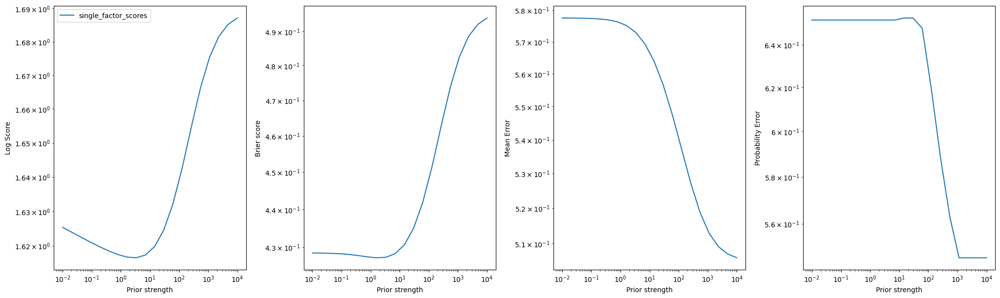

In [ ]:
plot_scores([("single_factor_scores", single_factor_scores)], "Prior strength")

In [ ]:
from pybpr.count_model.assessor.naive_bayes import NaiveBayes
from pybpr.count_model.dataset.movielens import *
import count_model.assessor.factored_naive_bayes as factored_naive_bayes


def make_interaction_factors(
    counter: EventCounter,
    unconditioned_prior: NBElement,  # P(+)
    factor_weight: float,
):
    def get_factors(
        conditioning_df: pandas.DataFrame,
        action_row,
    ) -> float:
        target_event = movielens.make_user_item_interaction(action_row)

        # prior = unconditioned_prior + NBElement(
        #     counter.get_count(verb_object_key, True, target_event.object),  # (+ rating, movie)
        #     counter.get_count(object_key, target_event.object),  # movie
        # )

        factors = []
        for (
            row_index,
            row,
        ) in conditioning_df.iterrows():  # for each previous rating on a movie
            src = movielens.make_user_item_interaction(row)
            fp = unconditioned_prior  # P(+ rating)
            if not src.verb:
                fp = fp.invert()  # P(rating)

            # fp = fp + NBElement(
            #     counter.get_count(verb_object_key, src.verb, src.object) # number of positive ratings for movie A
            #     - counter.get_count(
            #         unconditional_interaction_key,
            #         target_event.object,
            #         src.verb,
            #         src.object, # minus the number of positive ratings for movie A accompanied by a rating of movie B
            #     ),  # (rating, movie and target movie unrated)
            #     counter.get_count(object_key, src.object)
            #     - counter.get_count(
            #         link_key,
            #         target_event.object,
            #         src.object,
            #     ),
            # )  # P(src rating on src movie & target unrated)
            # # fp = fp * factor_weight
            fp = NBElement(
                fp.probability * factor_weight,
                factor_weight,
            )  # P(+A | A's ratings without known rating for B)

            # weighted prior on P(evidence) = P(rating | movie, movie rating history)
            # fp = fp * factor_weight

            # ex: user previously gave a positive rating to movie A, and we want to assess the probability of them positivly rating movie B
            factors.append(
                NBFactor(
                    fp
                    + NBElement(  # P(evidence | event)  P(+A | +B) ~ start with P(+A)
                        counter.get_count(
                            interaction_key,
                            src.verb,
                            src.object,
                            True,
                            target_event.object,
                        ),  # number of times that users have positively rated both A and B
                        # evidence & event: rating on src movie and positive rating on target movie
                        counter.get_count(
                            unconditional_interaction_key,
                            src.object,
                            True,
                            target_event.object,
                        ),  # number of times that users postively rated B, and rated A (positively or negatively)
                        # src interaction & event: rating of any kind on src movie and positive rating on target movie
                    ),
                    fp
                    + NBElement(  # P(evidence | !event) P(+A | -B) ~ start with P(+A)
                        counter.get_count(
                            interaction_key,
                            src.verb,
                            src.object,
                            False,
                            target_event.object,
                        ),  # number of times that users positively A and negatively rated B
                        # evidence & !event: rating on src movie and negative rating on target movie
                        counter.get_count(
                            unconditional_interaction_key,
                            src.object,
                            False,
                            target_event.object,
                        ),  # number of times that users negatively rated B, and rated A (positively or negatively)
                        # src interaction & !event : rating of any kind on src movie and negative rating on target movie
                    ),
                )
            )
        # print(f"factors: {factors}")
        return factors

        # p = factored_naive_bayes.compute_naive_bayes(
        #     prior,
        #     factors,
        # )

        # if not target_event.verb:
        #     p = 1.0 - p

        # print(f"target: {target_event.verb} {p}")
        # return p

    return get_factors

In [ ]:
unconditioned_prior = NBElement(
    3 * pos_bayes,
    3,
)


def make_interaction_assesor(interaction_weight):
    return make_assess_nb(
        counter,
        unconditioned_prior,
        [
            make_interaction_factors(
                counter,
                unconditioned_prior,
                interaction_weight,
            )
        ],
    )


interaction_scores = evalaute_parameter_sweep(
    np.power(10, np.linspace(-3, 5, 20)), make_interaction_assesor
)

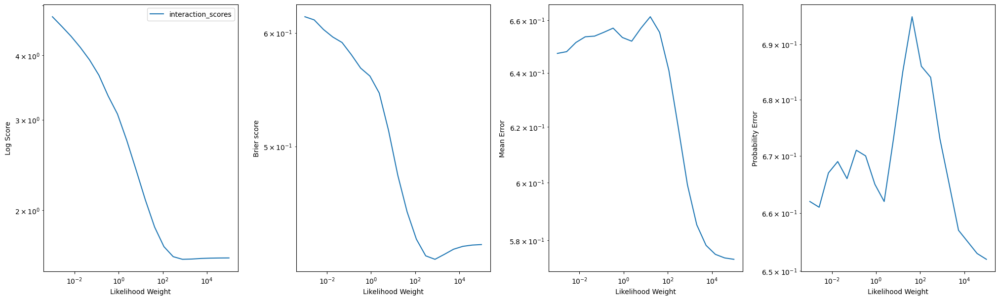

In [ ]:
plot_scores([("interaction_scores", interaction_scores)], "Likelihood Weight")

In [ ]:
from pybpr.count_model.assessor.naive_bayes import NaiveBayes
from pybpr.count_model.dataset.movielens import *
import count_model.assessor.factored_naive_bayes as factored_naive_bayes


def make_interaction_factors_2(
    counter: EventCounter,
    unconditioned_prior: NBElement,  # P(+)
    factor_weight: float,
):
    def get_factors(
        conditioning_df: pandas.DataFrame,
        action_row,
    ) -> float:
        target_event = movielens.make_user_item_interaction(action_row)

        # prior = unconditioned_prior + NBElement(
        #     counter.get_count(verb_object_key, True, target_event.object),  # (+ rating, movie)
        #     counter.get_count(object_key, target_event.object),  # movie
        # )

        factors = []
        for (
            row_index,
            row,
        ) in conditioning_df.iterrows():  # for each previous rating on a movie
            src = movielens.make_user_item_interaction(row)
            fp = unconditioned_prior  # P(+ rating)
            if not src.verb:
                fp = fp.invert()  # P(rating)

            fp = (
                fp
                + NBElement(
                    counter.get_count(
                        verb_object_key, src.verb, src.object
                    )  # number of positive ratings for movie A
                    - counter.get_count(
                        unconditional_interaction_key,
                        target_event.object,
                        src.verb,
                        src.object,  # minus the number of positive ratings for movie A accompanied by a rating of movie B
                    ),  # (rating, movie and target movie unrated)
                    counter.get_count(object_key, src.object)
                    - counter.get_count(
                        link_key,
                        target_event.object,
                        src.object,
                    ),
                )
                * factor_weight
            )  # P(src rating on src movie & target unrated)
            # # fp = fp * factor_weight
            # fp = NBElement(
            #     fp.probability * factor_weight,
            #     factor_weight,
            # ) # P(+A | A's ratings without known rating for B)

            # weighted prior on P(evidence) = P(rating | movie, movie rating history)
            # fp = fp * factor_weight

            # ex: user previously gave a positive rating to movie A, and we want to assess the probability of them positivly rating movie B
            factors.append(
                NBFactor(
                    fp
                    + NBElement(  # P(evidence | event)  P(+A | +B) ~ start with P(+A)
                        counter.get_count(
                            interaction_key,
                            src.verb,
                            src.object,
                            True,
                            target_event.object,
                        ),  # number of times that users have positively rated both A and B
                        # evidence & event: rating on src movie and positive rating on target movie
                        counter.get_count(
                            unconditional_interaction_key,
                            src.object,
                            True,
                            target_event.object,
                        ),  # number of times that users postively rated B, and rated A (positively or negatively)
                        # src interaction & event: rating of any kind on src movie and positive rating on target movie
                    ),
                    fp
                    + NBElement(  # P(evidence | !event) P(+A | -B) ~ start with P(+A)
                        counter.get_count(
                            interaction_key,
                            src.verb,
                            src.object,
                            False,
                            target_event.object,
                        ),  # number of times that users positively A and negatively rated B
                        # evidence & !event: rating on src movie and negative rating on target movie
                        counter.get_count(
                            unconditional_interaction_key,
                            src.object,
                            False,
                            target_event.object,
                        ),  # number of times that users negatively rated B, and rated A (positively or negatively)
                        # src interaction & !event : rating of any kind on src movie and negative rating on target movie
                    ),
                )
            )
        # print(f"factors: {factors}")
        return factors

        # p = factored_naive_bayes.compute_naive_bayes(
        #     prior,
        #     factors,
        # )

        # if not target_event.verb:
        #     p = 1.0 - p

        # print(f"target: {target_event.verb} {p}")
        # return p

    return get_factors

In [ ]:
def make_passthrough_interaction_assesor(interaction_weight):
    return make_assess_nb(
        counter,
        unconditioned_prior,
        [
            make_interaction_factors_2(
                counter,
                unconditioned_prior * 2e2,
                interaction_weight,
            )
        ],
    )


passthrough_interaction_scores = evalaute_parameter_sweep(
    np.power(10, np.linspace(-3, 5, 20)), make_passthrough_interaction_assesor
)

[autoreload of count_model.dataset.movielens failed: Traceback (most recent call last):
  File "/home/ctripp/zazzle/env/lib/python3.10/site-packages/IPython/extensions/autoreload.py", line 273, in check
    superreload(m, reload, self.old_objects)
  File "/home/ctripp/zazzle/env/lib/python3.10/site-packages/IPython/extensions/autoreload.py", line 471, in superreload
    module = reload(module)
  File "/home/ctripp/zazzle/env/lib/python3.10/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 619, in _exec
  File "<frozen importlib._bootstrap_external>", line 879, in exec_module
  File "<frozen importlib._bootstrap_external>", line 1017, in get_code
  File "<frozen importlib._bootstrap_external>", line 947, in source_to_code
  File "<frozen importlib._bootstrap>", line 241, in _call_with_frames_removed
  File "/home/ctripp/zazzle/pybpr/count_model/dataset/movielens.py", line 412
    action_key = 'a'
    ^^^^^^^^^^
In

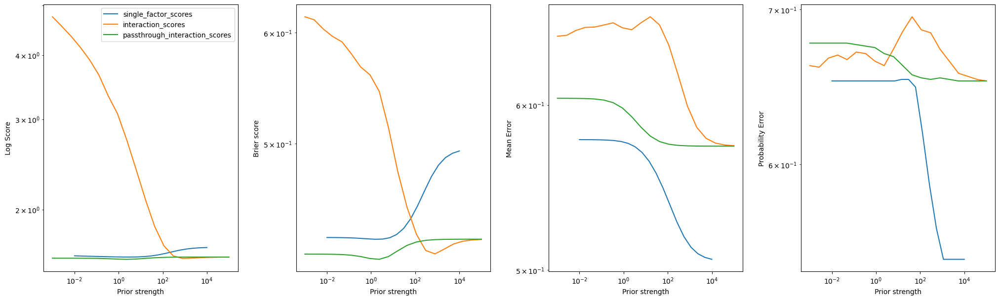

In [ ]:
plot_scores(
    [
        ("single_factor_scores", single_factor_scores),
        ("interaction_scores", interaction_scores),
        ("passthrough_interaction_scores", passthrough_interaction_scores),
    ],
    "Prior strength",
)

In [ ]:
from pybpr.count_model.assessor.naive_bayes import NaiveBayes
from pybpr.count_model.dataset.movielens import *
import count_model.assessor.factored_naive_bayes as factored_naive_bayes


def make_stem_nb_factors(
    counter: EventCounter,
    unconditioned_prior: NBElement,
    factor_weight: float,
):
    def get_factors(
        conditioning_df: pandas.DataFrame,
        action_row,
    ) -> float:
        # target_event = movielens.make_user_item_interaction(action_row)

        factors = []
        for src in movielens.get_stem_interactions(action_row):
            fp = unconditioned_prior  # P(+ rating)
            if not src.verb:
                fp = fp.invert()  # P(rating)

            # fp = fp + NBElement(
            #     counter.get_count(stem_action_key, src.verb, src.object),
            #     counter.get_count(stem_key, src.object),
            # )

            fp = NBElement(
                fp.probability * factor_weight,
                factor_weight,
            )

            factors.append(
                NBFactor(
                    fp
                    + NBElement(  # P(evidence | event)
                        counter.get_count(
                            stem_action_key,
                            True,
                            src.object,
                        ),  # evidence & event: (feature & positive rating)
                        counter.get_count(
                            action_key,
                            True,
                        ),  # src interaction & event: (postitive rating)
                    ),
                    fp
                    + NBElement(  # P(evidence | !event)
                        counter.get_count(
                            stem_action_key,
                            False,
                            src.object,
                        ),  # evidence & !event: (feature & negative rating)
                        counter.get_count(
                            action_key,
                            False,
                        ),  # src interaction & !event : (negative rating)
                    ),
                )
            )
        return factors

    return get_factors

In [ ]:
from pybpr.count_model.assessor.naive_bayes import NaiveBayes
from pybpr.count_model.dataset.movielens import *
import count_model.assessor.factored_naive_bayes as factored_naive_bayes



def make_stem_nb_user_factors(
    counter: EventCounter,
    unconditioned_prior: NBElement,
    factor_weight: float,
):
    def get_factors(
        conditioning_df: pandas.DataFrame,
        action_row,
    ) -> float:
        # target_event = movielens.make_user_item_interaction(action_row)

        factors = []
        for src in movielens.get_stem_interactions(action_row):
            fp = unconditioned_prior  # P(+ rating)
            if not src.verb:
                fp = fp.invert()  # P(rating)

            # fp = fp + NBElement(
            #     counter.get_count(stem_action_key, src.verb, src.object),
            #     counter.get_count(stem_key, src.object),
            # )
            
            fp = NBElement(
                fp.probability * factor_weight,
                factor_weight,
            )

            population_positive = NBElement(  # P(evidence | event)
                        counter.get_count(
                            stem_action_key,
                            True,
                            src.object,
                        ),  # evidence & event: (feature & positive rating) 
                        counter.get_count(
                            action_key, 
                            True,
                        ),  # src interaction & event: (postitive rating)
                    )
            
            user_positive = (population_positive.
            
            population_negative = NBElement(  # P(evidence | !event)
                        counter.get_count(
                            stem_action_key,
                            False,
                            src.object,
                        ),  # evidence & !event: (feature & negative rating)
                        counter.get_count(
                            action_key,
                            False,
                        ),  # src interaction & !event : (negative rating)
                    )

            factors.append(
                NBFactor(
                    fp
                    + NBElement(  # P(evidence | event)
                        counter.get_count(
                            stem_action_key,
                            True,
                            src.object,
                        ),  # evidence & event: (feature & positive rating) 
                        counter.get_count(
                            action_key, 
                            True,
                        ),  # src interaction & event: (postitive rating)
                    ),
                    fp
                    + NBElement(  # P(evidence | !event)
                        counter.get_count(
                            stem_action_key,
                            False,
                            src.object,
                        ),  # evidence & !event: (feature & negative rating)
                        counter.get_count(
                            action_key,
                            False,
                        ),  # src interaction & !event : (negative rating)
                    ),
                )
            )
        return factors

    return get_factors


SyntaxError: '(' was never closed (207044948.py, line 46)

In [ ]:
def make_stem_assesor(likelihood_weight):
    return make_assess_nb(
        counter,
        unconditioned_prior,
        [
            make_stem_nb_factors(
                counter,
                unconditioned_prior,
                likelihood_weight,
            )
        ],
    )


stem_scores = evalaute_parameter_sweep(
    np.power(10, np.linspace(-3, 5, 20)), make_stem_assesor
)

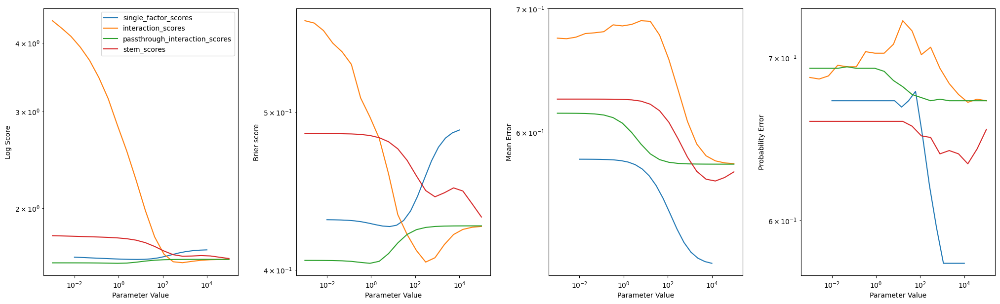

In [ ]:
plot_scores(
    [
        ("single_factor_scores", single_factor_scores),
        ("interaction_scores", interaction_scores),
        ("passthrough_interaction_scores", passthrough_interaction_scores),
        ("stem_scores", stem_scores),
    ],
    "Parameter Value",
)

In [ ]:
def make_stem_assesor(likelihood_weight):
    return make_assess_nb(
        counter,
        unconditioned_prior,
        [
            make_stem_nb_factors(
                counter,
                unconditioned_prior,
                likelihood_weight,
            ),
            make_interaction_factors(
                counter,
                unconditioned_prior,
                1.0,
            ),
        ],
    )


stem_scores = evalaute_parameter_sweep(
    np.power(10, np.linspace(-3, 5, 20)), make_stem_assesor
)

In [ ]:
stem_interaction_nb_score = movielens.compute_scores_2(
    df,
    train_df,
    test_df_sample,
    make_assess_nb(
        counter,
        unconditioned_prior,
        [
            make_stem_nb_factors(
                counter,
                unconditioned_prior,
                1.0,
            ),
            make_interaction_factors(
                counter,
                unconditioned_prior,
                1.0,
            ),
        ],
    ),
)

pprint(stem_interaction_nb_score)

ScoreSummary(dynamic=[Evaluation(name='log',
                                 score=2.826456540827444,
                                 positives=2.352710367109631,
                                 negatives=3.4700362485195675),
                      Evaluation(name='brier',
                                 score=0.4893645248826843,
                                 positives=0.35158078104021434,
                                 negatives=0.6765424410460397),
                      Evaluation(name='prob',
                                 score=0.7002753417222072,
                                 positives=0.7730765758483997,
                                 negatives=0.60137555196587),
                      Evaluation(name='accuracy',
                                 score=0.709,
                                 positives=0.7899305555555556,
                                 negatives=0.5990566037735849)],
             dynamic_ndcg=0.0)


In [ ]:
stem_interaction_nb_score2 = movielens.compute_scores_2(
    df,
    train_df,
    test_df_sample,
    make_assess_nb(
        counter,
        unconditioned_prior,
        [
            make_stem_nb_factors(
                counter,
                unconditioned_prior,
                10.0,
            ),
            make_interaction_factors(
                counter,
                unconditioned_prior,
                1.0,
            ),
        ],
    ),
)

pprint(stem_interaction_nb_score2)

ScoreSummary(dynamic=[Evaluation(name='log',
                                 score=2.8196459352862284,
                                 positives=2.341711383582315,
                                 negatives=3.4689155149594697),
                      Evaluation(name='brier',
                                 score=0.48844643831514567,
                                 positives=0.3489054909614496,
                                 negatives=0.6780114988711102),
                      Evaluation(name='prob',
                                 score=0.6995624681369293,
                                 positives=0.773246285890119,
                                 negatives=0.5994636968495775),
                      Evaluation(name='accuracy',
                                 score=0.709,
                                 positives=0.7916666666666666,
                                 negatives=0.5966981132075472)],
             dynamic_ndcg=0.0)


In [ ]:
assess_interaction_nb_score = movielens.compute_scores_2(
    df,
    train_df,
    test_df_sample,
    make_assess_interaction_nb(
        counter,
        NBElement(
            10 * pos_bayes,
            10,
        ),
        1,
    ),
)

pprint(assess_interaction_nb_score)

NameError: name 'make_assess_interaction_nb' is not defined

factors: [[(57.29875 / 52.5) : (47.29875 / 42.5)], [(13.20125 / 55.5) : (11.20125 / 47.5)], [(4.70125 / 10.0) : (3.70125 / 7.0)], [(2.20125 / 9.0) : (3.20125 / 9.0)], [(22.20125 / 55.0) : (20.20125 / 44.0)], [(2.20125 / 5.0) : (2.20125 / 5.0)], [(23.29875 / 21.5) : (18.29875 / 15.5)], [(9.79875 / 14.5) : (8.79875 / 13.5)], [(13.79875 / 16.5) : (9.79875 / 11.5)], [(2.20125 / 5.0) : (2.20125 / 5.0)], [(9.29875 / 12.0) : (8.29875 / 11.0)], [(11.29875 / 12.0) : (10.29875 / 12.0)], [(24.29875 / 23.0) : (22.29875 / 19.0)], [(10.29875 / 11.5) : (7.29875 / 7.5)], [(4.70125 / 14.0) : (3.70125 / 12.0)], [(50.79875 / 67.0) : (35.79875 / 50.0)], [(2.20125 / 5.5) : (2.20125 / 5.5)], [(33.29875 / 29.0) : (25.29875 / 20.0)], [(53.29875 / 39.0) : (41.29875 / 28.0)], [(55.29875 / 49.0) : (45.29875 / 35.0)], [(12.79875 / 15.0) : (8.79875 / 10.0)], [(15.79875 / 15.0) : (11.79875 / 12.0)], [(6.70125 / 13.5) : (5.70125 / 9.5)], [(23.79875 / 23.0) : (21.79875 / 21.0)], [(8.20125 / 17.5) : (8.20125 / 14.5)],

/home/ctripp/zazzle/pybpr/count_model/assessor/factored_naive_bayes.py:22: RuntimeWarning: invalid value encountered in log
  acc = numpy.log(numpy.array([prior_probability, 1.0 - prior_probability]))


factors: [[(58.79875 / 45.0) : (68.79875 / 58.0)], [(23.70125 / 49.0) : (35.70125 / 62.0)], [(18.79875 / 15.5) : (22.79875 / 21.5)], [(7.70125 / 14.0) : (15.70125 / 24.0)], [(2.70125 / 5.5) : (4.70125 / 7.5)], [(7.20125 / 14.5) : (11.20125 / 19.5)]]
nb: [0.08010777 0.03772669] 0.6798331043570737
target: False 0.32016689564292633
factors: [[(82.29875 / 76.5) : (45.29875 / 26.5)], [(41.70125 / 77.5) : (17.70125 / 33.5)], [(23.79875 / 22.5) : (17.79875 / 14.5)], [(16.20125 / 24.0) : (7.20125 / 14.0)], [(3.20125 / 6.0) : (4.20125 / 7.0)], [(13.70125 / 23.5) : (4.70125 / 10.5)], [(8.70125 / 13.0) : (5.70125 / 9.0)], [(18.70125 / 25.0) : (9.70125 / 13.0)], [(22.20125 / 29.5) : (12.20125 / 16.5)], [(6.20125 / 9.0) : (4.20125 / 7.0)], [(9.20125 / 14.0) : (8.20125 / 12.0)], [(2.20125 / 5.0) : (2.20125 / 5.0)], [(2.79875 / 5.0) : (2.79875 / 5.0)], [(2.79875 / 5.0) : (2.79875 / 5.0)], [(74.29875 / 62.0) : (27.29875 / 15.0)], [(82.79875 / 71.0) : (40.79875 / 23.0)], [(25.79875 / 26.5) : (9.79875 /

In [ ]:
from pybpr.count_model.evaluate.evaluate import (
    brier_score,
    compute_ndcg,
    log_score,
    prob_score,
    accuracy_score,
)

evaluation_functions = (
    ("log", log_score),
    ("brier", brier_score),
    ("prob", prob_score),
    ("accuracy", accuracy_score),
)

from pybpr.count_model.assessor.naive_bayes import NaiveBayes
from pybpr.count_model.dataset.movielens import *

nb_scores = compute_scores(
    df,
    train_df,
    test_df_sample,
    NaiveBayes(
        event_counter,
        co_occurrence_counter.link_counter,
        pos_bayes * 100,
        100,
        1e-9,
        2e-9,
        1e-9,
        2e-9,
    ),
)

pprint(nb_scores)

AttributeError: 'Series' object has no attribute 'negative'

In [ ]:
max_scores = compute_scores(
    df,
    train_df,
    test_df_sample,
    make_assessment_function(
        compute_max_posterior(
            pos_bayes * 10,
            10,
            pos_bayes * 10,
            10,
        ),
        event_counter,
        co_occurrence_counter.link_counter,
    ),
)
pprint(max_scores)

In [ ]:
avg_scores = compute_scores(
    df,
    train_df,
    test_df_sample,
    make_assessment_function(
        compute_avg_posterior(
            pos_bayes * 10,
            10,
            pos_bayes * 10,
            10,
        ),
        event_counter,
        co_occurrence_counter.link_counter,
    ),
)

pprint(avg_scores)

In [ ]:
combined_scores = compute_scores(
    df,
    train_df,
    test_df_sample,
    make_assessment_function(
        compute_combined_posterior(
            pos_bayes * 10,
            10,
        ),
        event_counter,
        co_occurrence_counter.link_counter,
    ),
)

pprint(combined_scores)

In [ ]:
bayes_scores = compute_scores(
    df,
    train_df,
    test_df_sample,
    make_assessment_function(
        compute_bayes_posterior(
            pos_bayes * 10,
            10,
        ),
        event_counter,
        co_occurrence_counter.link_counter,
    ),
)

pprint(bayes_scores)

In [ ]:
inb_scores = compute_scores(
    df,
    train_df,
    test_df_sample,
    make_assessment_function(
        compute_naive_bayes_posterior(
            pos_bayes * 100,
            100,
            1e-9,
            2e-9,
            1e3,
            2e3,
        ),
        event_counter,
        co_occurrence_counter.link_counter,
    ),
)

pprint(nb_scores)
pprint(inb_scores)

In [ ]:
inb_scores = compute_scores(
    df,
    train_df,
    test_df_sample,
    make_assessment_function(
        compute_naive_bayes_posterior(
            pos_bayes * 10,
            10,
            1e-3,
            2e-3,
            1e-3,
            2e-3,
        ),
        event_counter,
        co_occurrence_counter.link_counter,
    ),
)

pprint(nb_scores)
pprint(inb_scores)

In [ ]:
inb_scores = compute_scores(
    df,
    train_df,
    test_df_sample,
    make_assessment_function(
        compute_naive_bayes_posterior(
            pos_bayes * 10,
            10,
            1e-6,
            2e-6,
            1e-6,
            2e-6,
        ),
        event_counter,
        co_occurrence_counter.link_counter,
    ),
)

pprint(inb_scores)

In [ ]:
inb_scores = compute_scores(
    df,
    train_df,
    test_df_sample,
    make_assessment_function(
        compute_naive_bayes_posterior(
            pos_bayes * 1,
            1,
            1e-6,
            2e-6,
            1e-6,
            2e-6,
        ),
        event_counter,
        co_occurrence_counter.link_counter,
    ),
)

pprint(inb_scores)

In [ ]:
inb_scores = compute_scores(
    df,
    train_df,
    test_df_sample,
    make_assessment_function(
        compute_naive_bayes_posterior(
            pos_bayes * 1,
            1,
            1e-9,
            2e-9,
            1e-9,
            2e-9,
        ),
        event_counter,
        co_occurrence_counter.link_counter,
    ),
)

pprint(inb_scores)